## Сегментация пинов микросхем
### Основная цель - сегментировать пины, распознанных детектором микросхем

In [9]:
import tensorflow as tf
from tensorflow.keras import utils
import matplotlib.pyplot as plt
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
import cv2


In [6]:
# Загружаем подготовленные данные 
x_train = np.load('data/x_train.npy')
y_train = np.load('./data/y_train.npy')
x_test = np.load('./data/x_val.npy')
y_test = np.load('./data/y_val.npy')

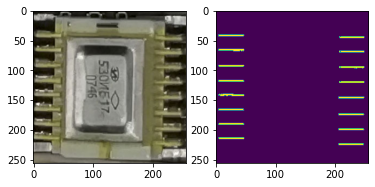

In [7]:
# Смотрим изображение и маску

plt.subplot(1, 2, 1)
plt.imshow(x_train[0])
plt.subplot(1, 2, 2)
plt.imshow(y_train[0][:,:,1])
plt.show()

In [7]:
# Делим на обучающую и валидационную выборки в пропорции 1 к 9 
xTrain, yTrain, xVal, yVal = train_test_split(x_train, y_train, test_size = .1)

In [8]:
# Строим модель

def build_model():
    x = tf.keras.Input((256, 256, 3))
    
    out = tf.keras.layers.Conv2D(64, (3,3), padding='same', activation='relu')(x)
    out1 = tf.keras.layers.Conv2D(64, (3,3), padding='same', activation='relu')(out)
    out =  tf.keras.layers.MaxPool2D((2,2))(out1)
        
    out = tf.keras.layers.Conv2D(128, (3,3), padding='same', activation='relu')(out)
    out2 = tf.keras.layers.Conv2D(128, (3,3), padding='same', activation='relu')(out)
    out =  tf.keras.layers.MaxPool2D((2,2))(out2)
    
        
    out = tf.keras.layers.Conv2D(256, (3,3), padding='same', activation='relu')(out)
    out3 = tf.keras.layers.Conv2D(256, (3,3), padding='same', activation='relu')(out)
    out =  tf.keras.layers.MaxPool2D((2,2))(out3)
    
        
    out = tf.keras.layers.Conv2D(512, (3,3), padding='same', activation='relu')(out)
    out4 = tf.keras.layers.Conv2D(512, (3,3), padding='same', activation='relu')(out)
    out =  tf.keras.layers.MaxPool2D((2,2))(out4)
    
    out = tf.keras.layers.Conv2D(1024, (3,3), padding='same', activation='relu')(out)
    out = tf.keras.layers.Conv2D(1024, (3,3), padding='same', activation='relu')(out)
    
    out = tf.keras.layers.Conv2DTranspose(512, (3,3), strides=(2,2), padding='same', activation='relu')(out)
    out = tf.concat([out4, out], axis=3)
    
    out = tf.keras.layers.Conv2D(512, (3,3), padding='same', activation='relu')(out)
    out = tf.keras.layers.Conv2D(512, (3,3), padding='same', activation='relu')(out)
    
    out = tf.keras.layers.Conv2DTranspose(256, (3,3), strides=(2,2), padding='same', activation='relu')(out)
    out = tf.concat([out3, out], axis=3)
    
    out = tf.keras.layers.Conv2D(256, (3,3), padding='same', activation='relu')(out)
    out = tf.keras.layers.Conv2D(256, (3,3), padding='same', activation='relu')(out)
    
    out = tf.keras.layers.Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', activation='relu')(out)
    out = tf.concat([out2, out], axis=3)
    
    out = tf.keras.layers.Conv2D(128, (3,3), padding='same', activation='relu')(out)
    out = tf.keras.layers.Conv2D(128, (3,3), padding='same', activation='relu')(out)
    
    out = tf.keras.layers.Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', activation='relu')(out)
    out = tf.concat([out1, out], axis=3)
    
    out = tf.keras.layers.Conv2D(64, (3,3), padding='same', activation='relu')(out)
    out = tf.keras.layers.Conv2D(64, (3,3), padding='same', activation='relu')(out)
    # Выбираем softmax, так как формально класса 2 - пины и фон 
    out = tf.keras.layers.Conv2D(2, (3,3), padding='same', activation='softmax')(out)
    
    return  tf.keras.Model(inputs = x, outputs = out)
    
model = build_model()

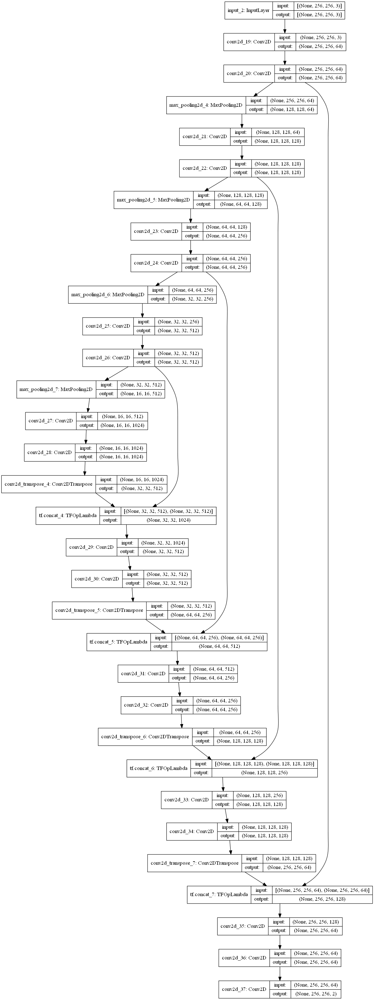

In [12]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [50]:
# Обучение происходило на ГПУ NVIDIA 1660 Super, обучалось около 150 минут 
# К сожалению лог обучения показать не могу

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(x = xTrain, y =  yTrain, verbose=1,
          validation_data=(xVal, yVal), epochs = 10, )

os.chdir('C:/Users/pshen/Desktop/работа/openCV/Фотографии для нейросети')
# Сохраняем веса модели
model.save_waights('./Semantic_segment/weights.hdf5') 

In [10]:
# воссоздаем модель 

model = build_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.load_weights('./data/U-net/weights.hdf5')

In [55]:
# Оценка качества на тестовых данных
model.evaluate(x_test, y_test)

7/7 [==============================] - 121s 17s/step - loss: 0.0690 - accuracy: 0.9788


[0.06898849457502365, 0.9788026809692383]

In [11]:
def show_result(n, data):

    out = model.predict(data[n][None, ...])
    
    seg = np.zeros((out.shape[1],out.shape[2]))
    seg = out[0,...].max(axis=2)
    seg_map_clr = plt.get_cmap('jet')(seg)[..., :3]
    
    plt.figure(figsize=(20,10))
    
    
    plt.subplot(1, 3, 1)
    plt.imshow(data[n])
    plt.subplot(1, 3, 2)
    plt.imshow(seg)
    plt.subplot(1, 3, 3)
    plt.imshow(data[n]*0.5 + seg_map_clr*0.5)
    
    plt.show()
    


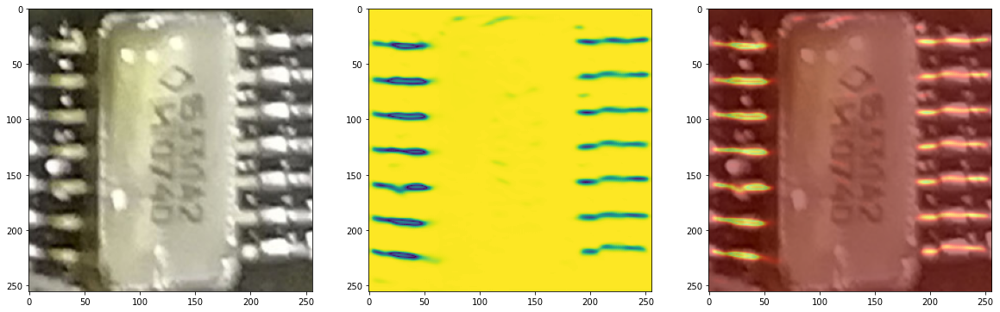

In [12]:
# Показываем результаты на тестовой выборке
show_result(randint(0, x_test.shape[0]), x_train)


In [13]:
def return_size(img, high, width):
    return tf.image.resize(img, (width, high + 150))


def in_production(bboxes, img, model):
    
    img = tf.image.resize(img, (3200, 4800))
    rows = len(bboxes)
    
    fig, axes = plt.subplots(rows, 3, figsize = (20,180))

    i = 0

    final_img = (np.array(img)/255).copy()

    for row in range(rows):

        y, x, high, width = bboxes[i]

        curr_img = np.array(img/255)[x:x+width, y-75:y+high+75, :]
        curr_img = tf.image.resize(curr_img, (256, 256))

        out = model.predict(curr_img[None, ...])

        seg = np.zeros((out.shape[1],out.shape[2]))
        seg = out[0,...].max(axis=2)

        seg_map_clr = plt.get_cmap('jet')(seg)[..., :3]
        seg_map_clr = curr_img*0.5 + seg_map_clr*0.5

        axes[row, 0].imshow(curr_img)
        axes[row, 1].imshow(seg)
        axes[row, 2].imshow(seg_map_clr)

        final_img[x:x+width, y-75:y+high+75, :] = return_size(seg_map_clr, high, width)

        i+=1
    return final_img

In [15]:
# # Загружае тестовое изображение 

# test_img = Image.open('C:/Users/pshen/Desktop/работа/Фотки/IMG_000182.JPG')
# plt.figure(figsize=(10,20))
# plt.imshow(test_img)

In [79]:
# Координаты боксов предсказанных с помошью детектора, к сожалению, реализованного 
# в матлабе((
bboxes = [[1226,1724,182,271],
[2740,1452,183,294],
[1231,965,183,266],
[213,1459,181,279],
[2250,1705,172,284],
[1743,1218,184,267],
[724, 1708, 173, 281],
[3741, 1461, 208, 306],
[1235, 1477, 174, 268],
[224, 1715, 173, 292],
[1746, 1727, 199, 275],
[2252, 1463, 182, 322],
[1237, 1222, 178, 264],
[3253, 1727, 182, 269],
[3769, 1736, 189, 269],
[3255, 1452, 175, 305],
[722, 1185, 184, 294],
[2756, 1727, 191, 253],
[1740, 1437, 169, 287],
[719, 1458, 178, 270],
[217, 1217, 181, 269],
[1720, 961, 192, 288]]


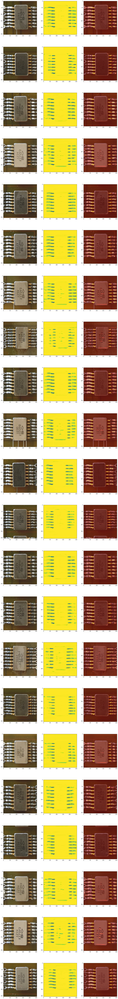

In [80]:
# "Вырезаем" каждую микросхему предсказанную детектором и сегментируем пины"
final_img = in_production(bboxes, test_img, model)

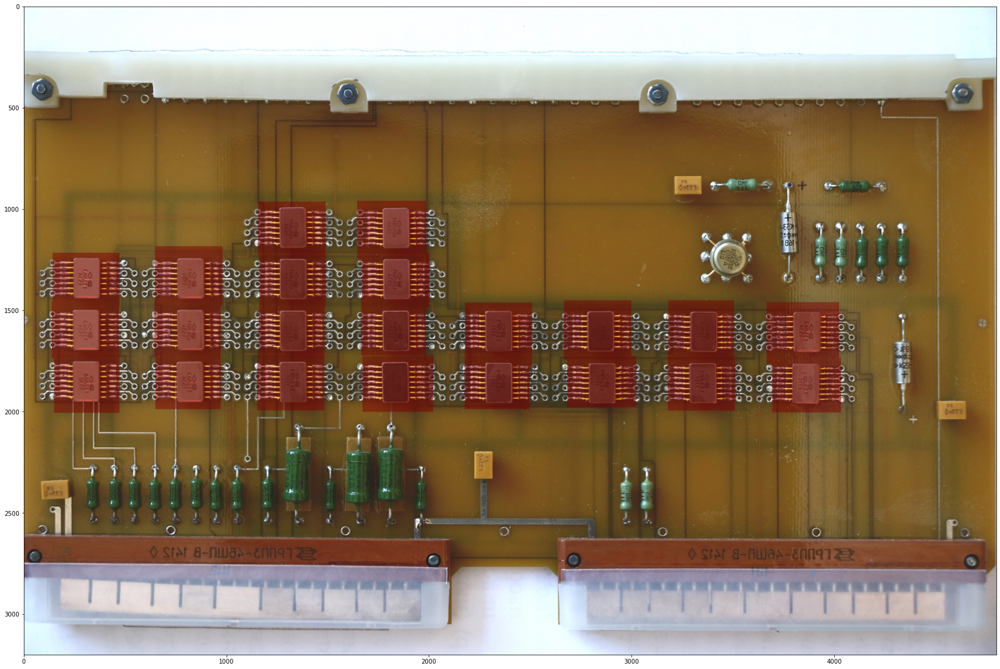

In [81]:
plt.figure(figsize = (30, 20))
plt.imshow(final_img)
#  Накладываем на исходное изображение

In [250]:
def show_cnt(img):
    
    ttt = img.copy()
    
    plt.figure(figsize=(10,10))
    
    det = model.predict(img[None, ...])[0,...][:,:,1]
    det = np.where(det > 0.1, 255, 0)

    contours, hierarchy = cv2.findContours(
    det.copy(),cv2.RETR_FLOODFILL ,cv2.CHAIN_APPROX_SIMPLE)

    i=0
    for cnt in contours:
        if cv2.contourArea(cnt) > 200:
            cv2.drawContours(ttt,[cnt],0,(0,255,0),1, cv2.CV_FILLED)
            i+=1
    plt.imshow(ttt)
    
    plt.show()
    
    print(i)
    


    


AttributeError: module 'cv2' has no attribute 'CV_FILLED'

<Figure size 720x720 with 0 Axes>